In [1]:
import cv2
import numpy as np
import math
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import pytesseract

In [3]:
# function to plot image.
def plotting(image, cmap = None):
    if cmap == 'gray':
        height, width = image.shape
    else:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        height, width, depth = image.shape
    
    dpi = mpl.rcParams['figure.dpi']
    figsize = width/float(dpi), height/float(dpi)
    fig = plt.figure(figsize = figsize)
    
    plt.imshow(image, cmap)

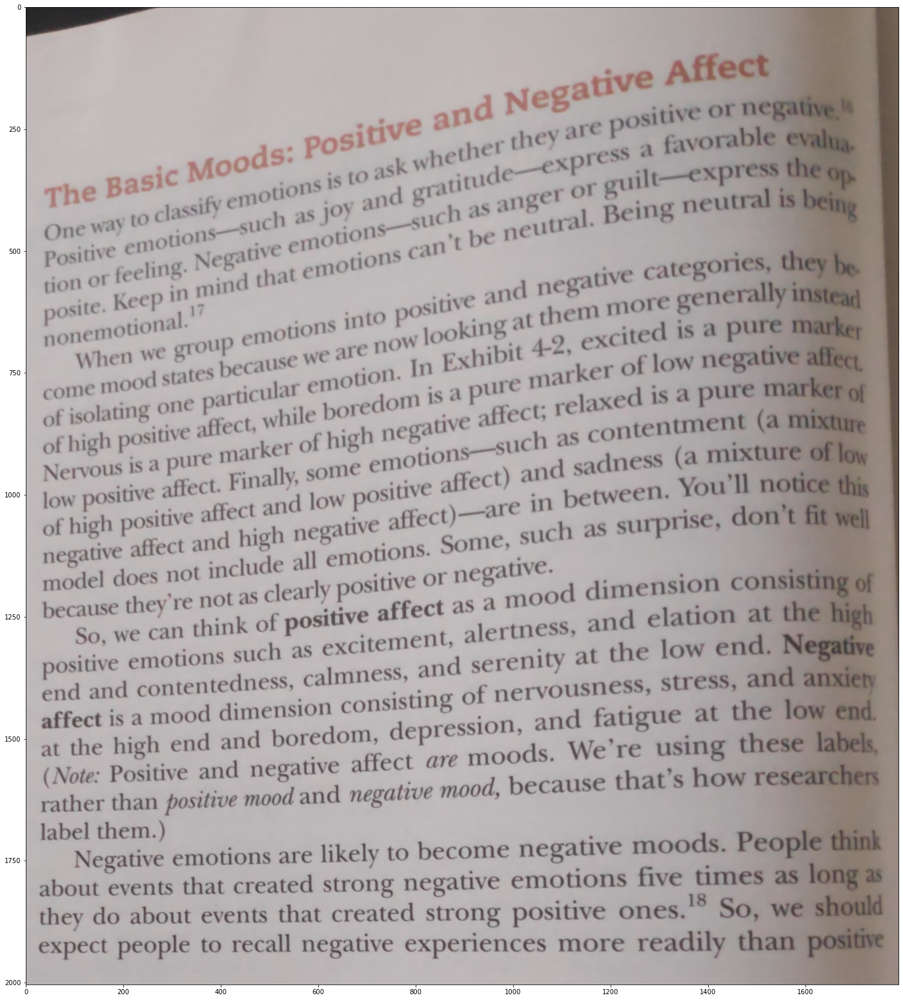

In [4]:
image = cv2.imread('Data/Images/Text with image part 1_text cropped.jpg')

plotting(image)

In [5]:
# Text without any preprocessing.
# Result is decent but the last part of the text is jumbled as the page was a bit folded. Need to fix it.

text = pytesseract.image_to_string(image)
print(text)

ions i
ifv mouo or 4 P
oneway™ a a ch as JY Pe such as ange ral. Bel
a ouons— “ou ai
Positive erring. aul emo n= es :
tion ol 7 in mind that e! : ail
osite. Kee 417 auve ® .
nonemotiona” e emotions a p ve
0 fe .
When we 8° eee gat th
ome mood states because W " oxi t fe tec ap
c
of isolating one
‘oh positive é Ow
ne ure marker ©
Nervous is a P te
i Finally, so™ ;
‘tive affect. 1 y; - “ff id
ee affect and lo
wd ive affect) —are in

of high positive
neggire affect and high oer eions. SOMES such as $

i de .
model does not inclu ive or negative- |
because they're not as clearly positive ga d dimension cor

if i
So, we can think of positive affect as 4 m

ness
positive emotions such as excitement, et ity at nc la .
end and contentedness, calmness, and ser nd. |

affect is a mood dimension consisting of nervousness, ee
at the high end and boredom, depression, and fatigue a
(Note: Positive and negative affect are moods. We're using these
rather than positive mood and negative mood, because t

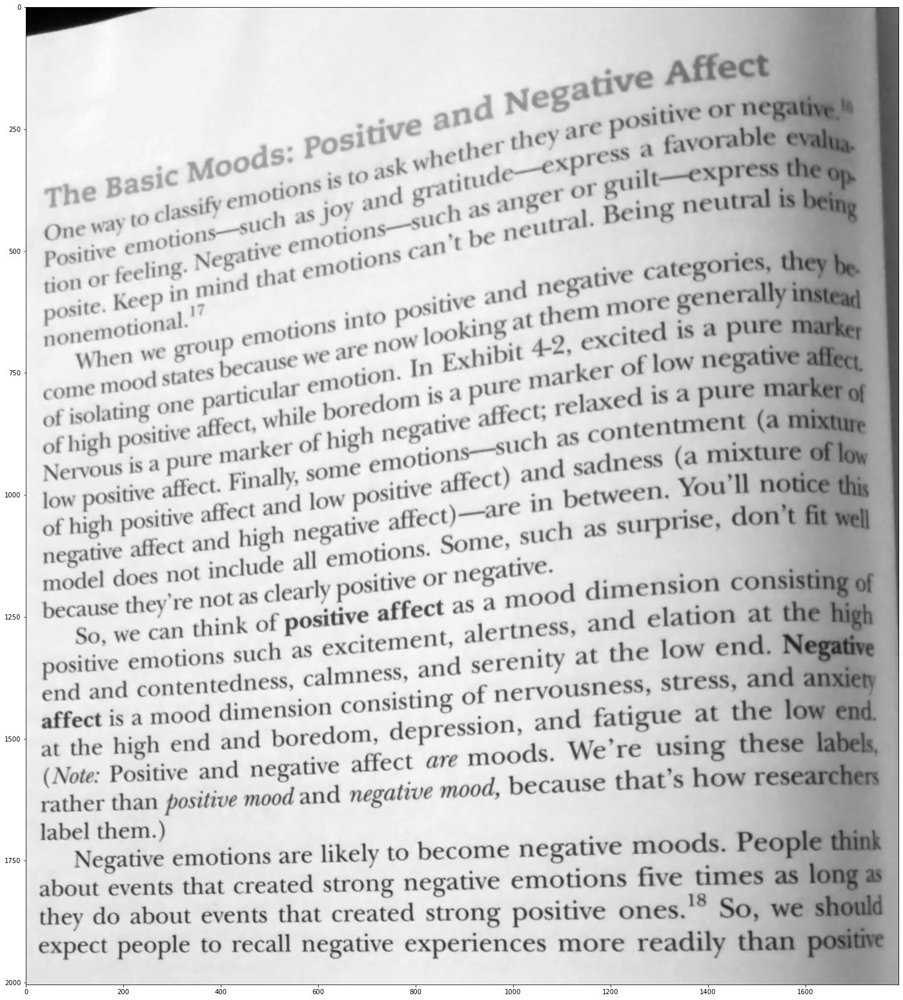

In [6]:
# converting image to greyscale.
# The image was already clear but the contrast between white and black is more now.
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plotting(gray, 'gray')

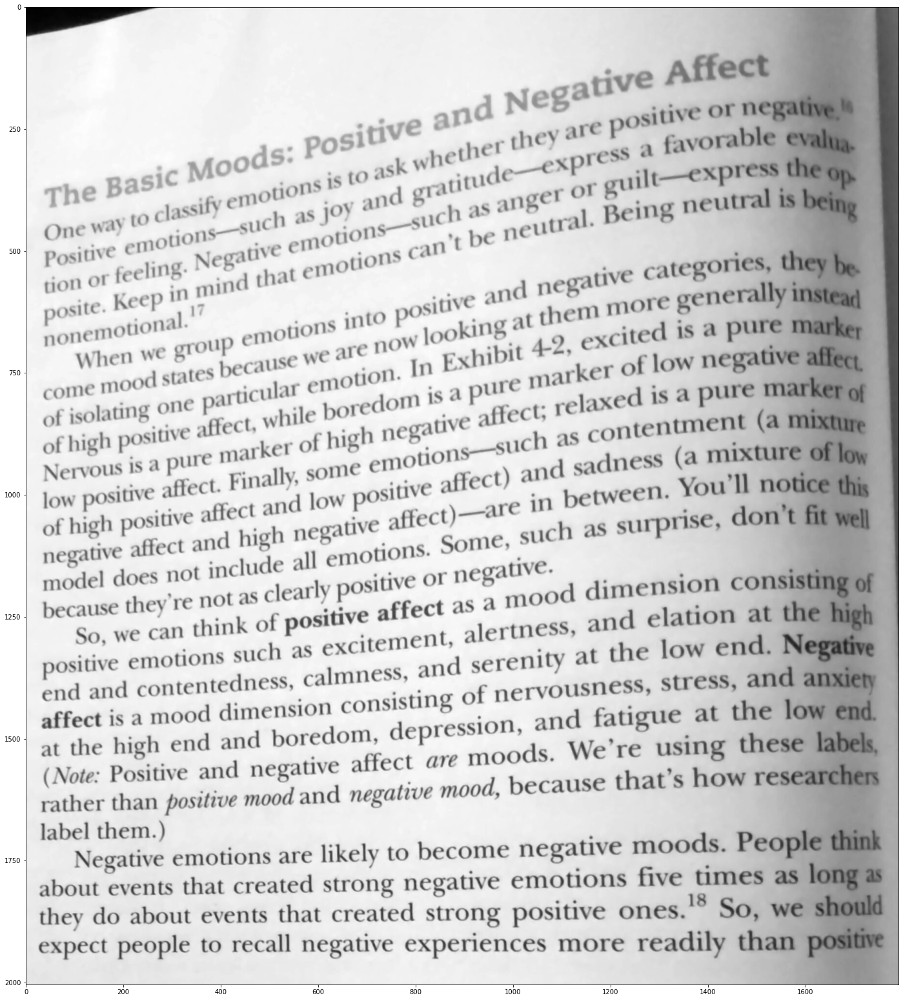

In [7]:
# Image smoothing/blurring (Median)
median = cv2.medianBlur(gray, 3)

plotting(median, 'gray')

In [8]:
# Text from far right bottom of the paper is not being converted string. 
text = pytesseract.image_to_string(median)
print(text)

nonemouona ;
pup

When we gt re are nt
come MO oe
of isolating one particulé
of high ositive
saber js a pure marker 0 hi
low positive ¢ ect. Finally, some nage oi
of high positive affect and low | ge Cee ae
negative affect and high negauve e sre opal
model does not include all emotions: ie

’ s clearly positive or c
Sere ink of soaitive affect as a mood dimension Cc
and elation at

So, we can thin
positive emotions such as excitement, alertness,
end and contentedness, calmness, and serenity at the low end.
rvousness, Stress,

affect is a mood dimension consisting of ne
at the high end and boredom, depression, and fatigue at
(Note: Positive and negative affect a7 moods. We're using

rather than positive mood and negative mood, because that’s how
label them.)
Negative emotions are likely to become negative moods
— events that created strong negative emotions five times
a do about events that created strong positive ones Sa
pect people to recall negative experiences more readily

  
 
 
 

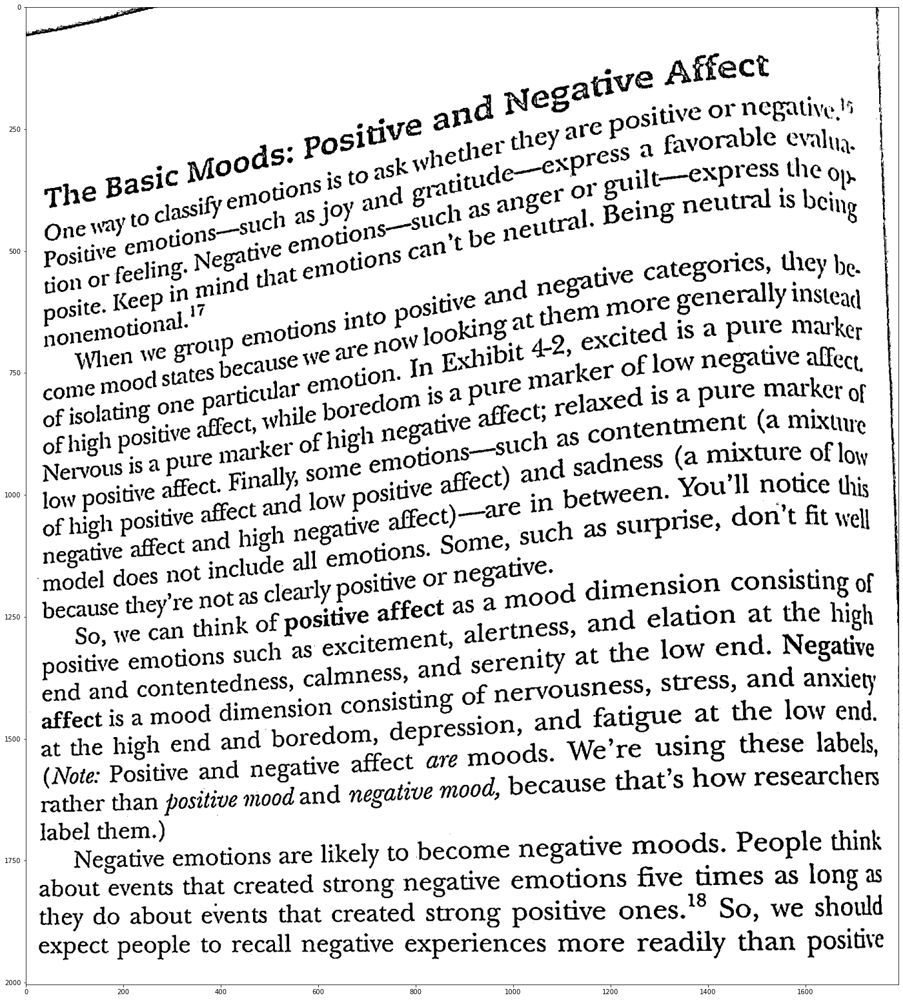

In [9]:
# Adaptive thresholding to make the image sharp again. we can observe major difference between the last image and this image.
adaptive_threshold_gaussian = cv2.adaptiveThreshold(median, 255, 
                                                    cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                                    cv2.THRESH_BINARY, 11, 2)
plotting(adaptive_threshold_gaussian, 'gray')

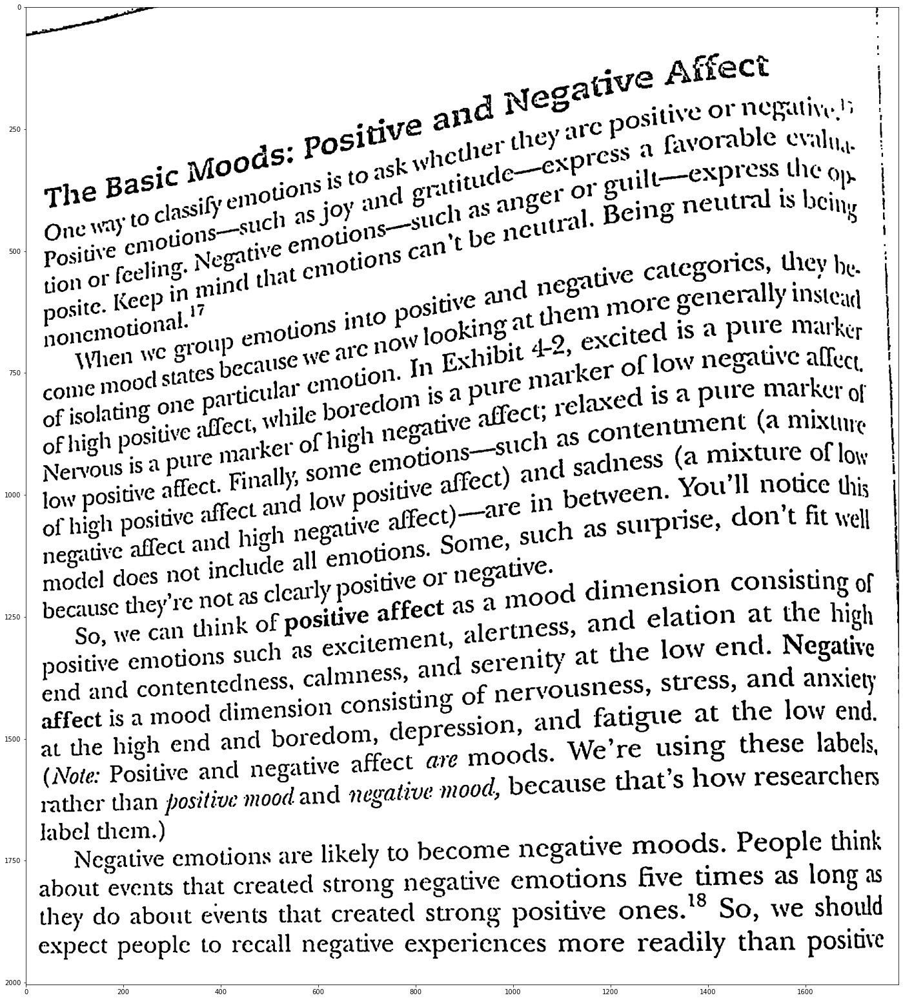

In [15]:
# Erosion and dilution to remove random noise.
imgThresh = cv2.dilate(adaptive_threshold_gaussian, cv2.getStructuringElement(cv2.MORPH_RECT, (3,3)))
imgThresh = cv2.erode(imgThresh, cv2.getStructuringElement(cv2.MORPH_RECT, (3,3)), iterations = 1)

plotting(imgThresh, 'gray')

In [16]:
text = pytesseract.image_to_string(imgThresh)
print(text)

wes . aerritin. 1s
itive and , "arc positive or negative 5
Vc a Dd gyur
gods: pos! jawhete! he) ress 4 favorable evalu,
7 i 3 ask . ae OX . . s~Nres “y
The Basi ifyem jons § an oratitue c >y OY i]t -EXPPESS: the O}»
-< . . t oO . . . ny . a
one way t© classify PT ch a8 JOY 2" such as an ral. Being neutral is being
Positive cmon gati notion can't be new’
ie . BT ert Ss < .
ne feeling: NS emotion . scories, they |
tion OF fee : mind that native categ oy ¥ be.
: Kee nt woe and nege es > rincte.
emotion’ ions into pose at them more generally insteaq
nonen ; »motio cing cl is a pure marke
When we gro! po now loom it 42> excited 1S 2 | arker

" re . .
| states because % : In Exhibit ver 0 Flow negative atfect

»mouon. -e war
ticular emo : ure me : ‘ eae ce
of isolating one Pa" uct ile boredom 'S @ P ef «relaxed is a pure may Ker of
a) > >

affect, while . a
of high posiuve alec et g vouch 28 contenunent (a mixune
tos re marke o —§ 8b er
Nervous 15 a Pvet. Finally some emouons ct) an d sadnes

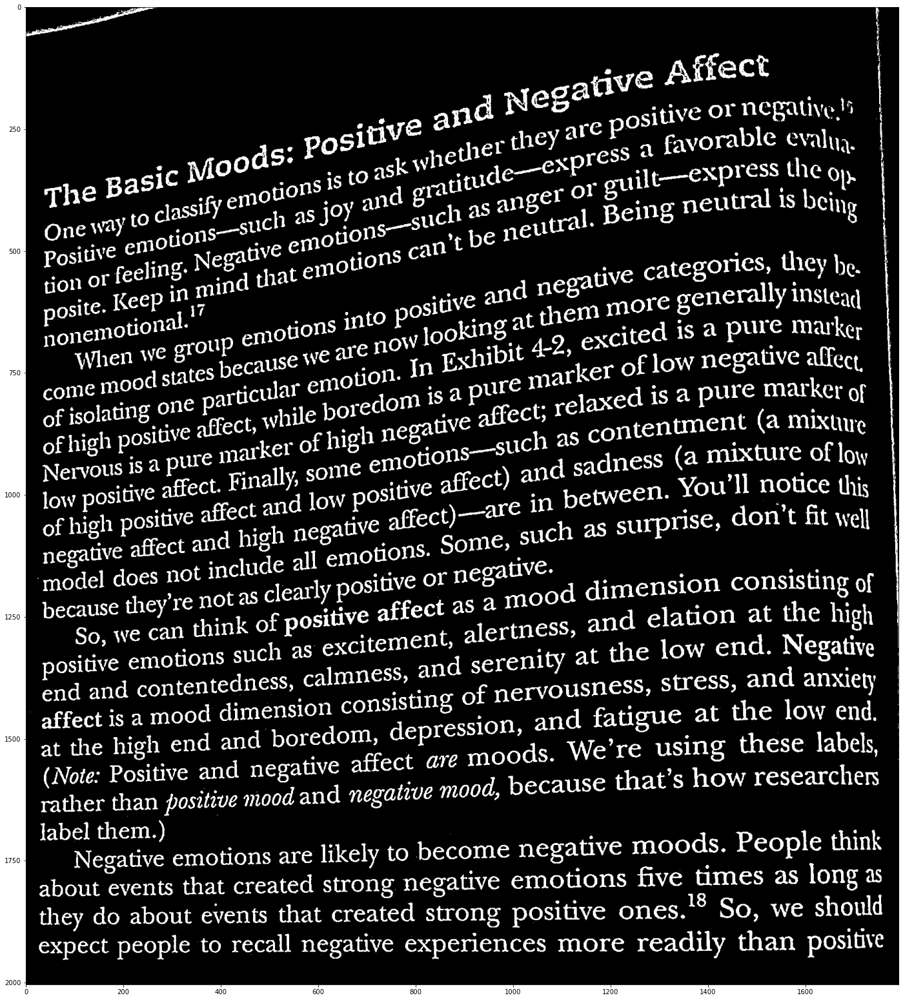

In [17]:
image_reverse = cv2.bitwise_not(adaptive_threshold_gaussian)
plotting(image_reverse, 'gray')

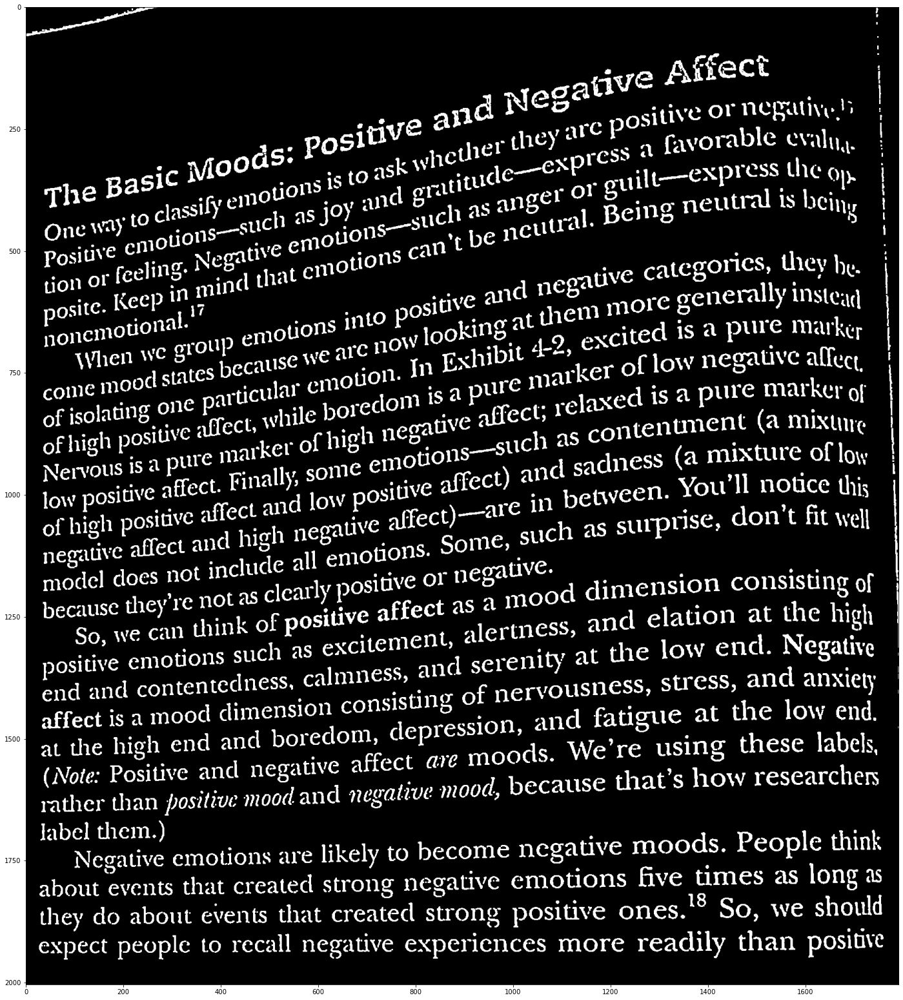

In [18]:
image_reverse = cv2.bitwise_not(imgThresh)
plotting(image_reverse, 'gray')

In [19]:
text = pytesseract.image_to_string(image_reverse)
print(text)

wes ; Tne
Teh and : a: positive or negative 5
Bars ~ Dd gyur
Pree aa Perel cae oct PN enK ea tne
4 a = ARLS 5 eo 7 ‘i et ysis 7
yee ae ifyem raed on Prelit c >y OY aT Ceicaas Sa the O}»
eT~1 - . Hy oO 5 . ' ny q a
esa CR Rett Abe fe role ACen a any
Positive tt ae or re vee be new’
he . BT ert Ss ra 5
Ren Tchad Peril ; scores, they |
Fe) i men Kee 5 mind abt er ekio categ a ails
A Xe nt woe PYata rules Shs - x te
Serre Perce loa ae ray oven Licata Peary ALS
nonen ; martes) ate: ct is a pure marke
SUA oTT mca ane po TOA Tae Boe eo aaa pa

7 re CG _
ales cent ; mn Oana aes atta ecrtthcs Ue

»mouon. Parle
Wrerintaaline : ure me p ‘ ae
eRe nui tial aie Samar Pa ecco ae «relaxed is a pure may oy
n a Pd

RAEN ree be , a
of high posiuve alec et g eee Wairaneecael Cwernatire
ae re marke o =) 8b er
Nervous 15 a eer some emotons ct) an d sadness (a mixture of low
oe an lw r4 3 <
oot est kainate

Rrra ; an. Youll notice this

Panicle onthe RM rrameue mane i affect) —are Tea alkane i don't fit aS



In [ ]:
{"name": "Taj hotels","restaurant_id": "20076","address": {"building": "11","coord": [ -23.877, 23. 447 ],"street": "Taj street","zipcode": "560077"},"borough": "Ealing","cuisine": "Hyderabadi","grades": [{ "date": { "$date": 1393804800000 }, "grade": "D", "score": 4 },{ "date": { "$date": 1378857600000 }, "grade": "A", "score": 6 },{ "date": { "$date": 1358985600000 }, "grade": "C", "score": 11 },{ "date": { "$date": 1322006400000 }, "grade": "A", "score": 9 },{ "date": { "$date": 1299715200000 }, "grade": "B", "score": 4 }]}
